In [1]:
import os
import sys

def add_path():
    path = os.path.abspath(os.path.join(os.getcwd(), "../"))
    if path not in sys.path:
        sys.path.append(path)
    
    path = os.path.abspath(os.path.join(os.getcwd(), "../../"))
    if path not in sys.path:
        sys.path.append(path)

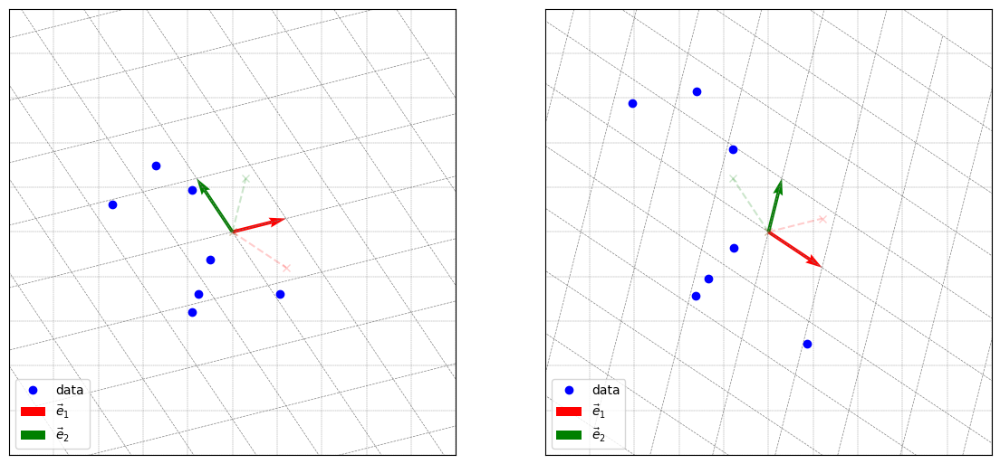

In [123]:
add_path()
from intuitive_understanding_of_linear_algebra.src import utils
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(7777777)

fig, axes = plt.subplots(1, 2, figsize=(14, 7))
ax1, ax2 = axes.flatten()

xlim = (-5, 5)
ylim = (-5, 5)

matrix_a = np.array(
    [
        [1.2, -0.8],
        [0.3, 1.2]
    ]
)

matrix_a_t = matrix_a.T

original_data_points = matrix_a @ np.random.uniform(-2, 2, (2, 7))

utils.plot_full_custom_2d_grid(ax1, np.eye(2), xlim, ylim, linewidth=0.3)
utils.plot_full_custom_2d_grid(ax1, matrix_a.T, xlim, ylim)

ax1.plot([0, matrix_a_t[0][0]], [0, matrix_a_t[1][0]], "x", color="r", linestyle="--", alpha=0.2)
ax1.plot([0, matrix_a_t[0][1]], [0, matrix_a_t[1][1]], "x", color="g", linestyle="--", alpha=0.2)
ax1.plot(original_data_points[0], original_data_points[1], "o", color="b", label="data")
ax1.quiver(0, 0, matrix_a[0][0], matrix_a[1][0], angles="xy", scale_units="xy", scale=1, color="r", label="$\\vec{e}_1$")
ax1.quiver(0, 0, matrix_a[0][1], matrix_a[1][1], angles="xy", scale_units="xy", scale=1, color="g", label="$\\vec{e}_2$")
ax1.set_xlim(-5, 5)
ax1.set_ylim(-5, 5)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_aspect("equal")
ax1.legend(loc="lower left")

transposed_data_points = matrix_a_t @ original_data_points

utils.plot_full_custom_2d_grid(ax2, np.eye(2), xlim, ylim, linewidth=0.3)
utils.plot_full_custom_2d_grid(ax2, matrix_a_t.T, xlim, ylim)

ax2.plot([0, matrix_a[0][0]], [0, matrix_a[1][0]], "x", color="r", linestyle="--", alpha=0.2)
ax2.plot([0, matrix_a[0][1]], [0, matrix_a[1][1]], "x", color="g", linestyle="--", alpha=0.2)
ax2.plot(transposed_data_points[0], transposed_data_points[1], "o", color="b", label="data")
ax2.quiver(0, 0, matrix_a_t[0][0], matrix_a_t[1][0], angles="xy", scale_units="xy", scale=1, color="r", label="$\\vec{e}_1$")
ax2.quiver(0, 0, matrix_a_t[0][1], matrix_a_t[1][1], angles="xy", scale_units="xy", scale=1, color="g", label="$\\vec{e}_2$")
ax2.set_xlim(-5, 5)
ax2.set_ylim(-5, 5)
ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_aspect("equal")
ax2.legend(loc="lower left")

plt.show()

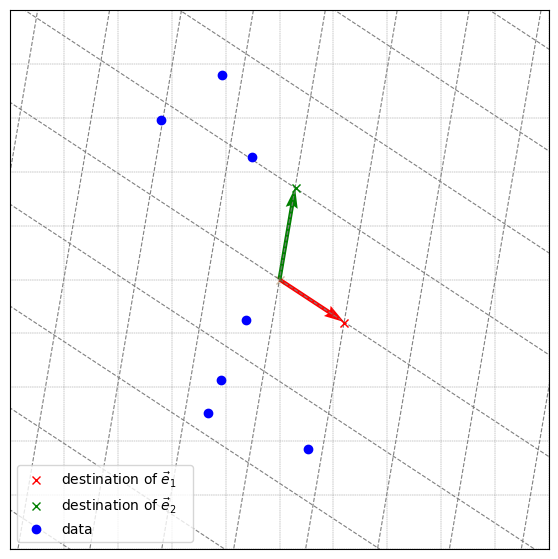

In [12]:
add_path()
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.animation as animation
from intuitive_understanding_of_linear_algebra.src import utils
from IPython.display import HTML

np.random.seed(7777777)

matrix_a = np.array(
    [
        [1.2, -0.8],
        [0.3, 1.7]
    ]
)

matrix_a_t = matrix_a.T

original_data_points = matrix_a @ np.random.uniform(-1.5, 1.5, (2, 7))

fig, ax = plt.subplots(figsize=(7, 7))
xlim = (-5, 5)
ylim = (-5, 5)

def update(frame):
    ax.clear()
    
    t = frame / frames
    interpolated_matrix = (1 - t) * matrix_a + t * matrix_a_t
    interpolated_points = interpolated_matrix @ original_data_points
    
    utils.plot_full_custom_2d_grid(ax, np.eye(2), xlim, ylim, linewidth=0.3)
    utils.plot_full_custom_2d_grid(ax, interpolated_matrix.T, xlim, ylim, linewidth=0.8)
    
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("equal")
    ax.plot(matrix_a_t[0][0], matrix_a_t[1][0], "x", color="r", label="destination of $\\vec{e}_1$   ")
    ax.plot(matrix_a_t[0][1], matrix_a_t[1][1], "x", color="g", label="destination of $\\vec{e}_2$   ")
    ax.plot([0, matrix_a_t[0][0]], [0, matrix_a_t[1][0]], "x", color="r", linestyle="--", alpha=0.2)
    ax.plot([0, matrix_a_t[0][1]], [0, matrix_a_t[1][1]], "x", color="g", linestyle="--", alpha=0.2)
    
    e1 = ax.quiver(0, 0, interpolated_matrix[0][0], interpolated_matrix[1][0], angles="xy", scale_units="xy", scale=1, color="r")
    e2 = ax.quiver(0, 0, interpolated_matrix[0][1], interpolated_matrix[1][1], angles="xy", scale_units="xy", scale=1, color="g")
    data_points = ax.plot(interpolated_points[0], interpolated_points[1], "o", color="b", label="data")[0]
    
    ax.legend(loc="lower left")

    return (e1, e2, data_points)

frames = 100
ani = animation.FuncAnimation(fig, update, frames=frames, blit=True)

html_str = ani.to_jshtml()
with open(os.path.join(os.getcwd(), "../animations/transposed-matrix.html"), "w") as f:
    f.write(html_str)

HTML(html_str)